In [ ]:
using PowerLawsEt
using Revise
using GLMakie
using GLM 
using DataFrames
using MAT
using Pkg
GLMakie.activate!(inline=true)
# activate the package. We are in /src.
if !isdefined(Main, :PowerLawsEt)
    Pkg.activate(joinpath(@__DIR__, ".."))
    Pkg.instantiate()
end
Pkg.activate("..")

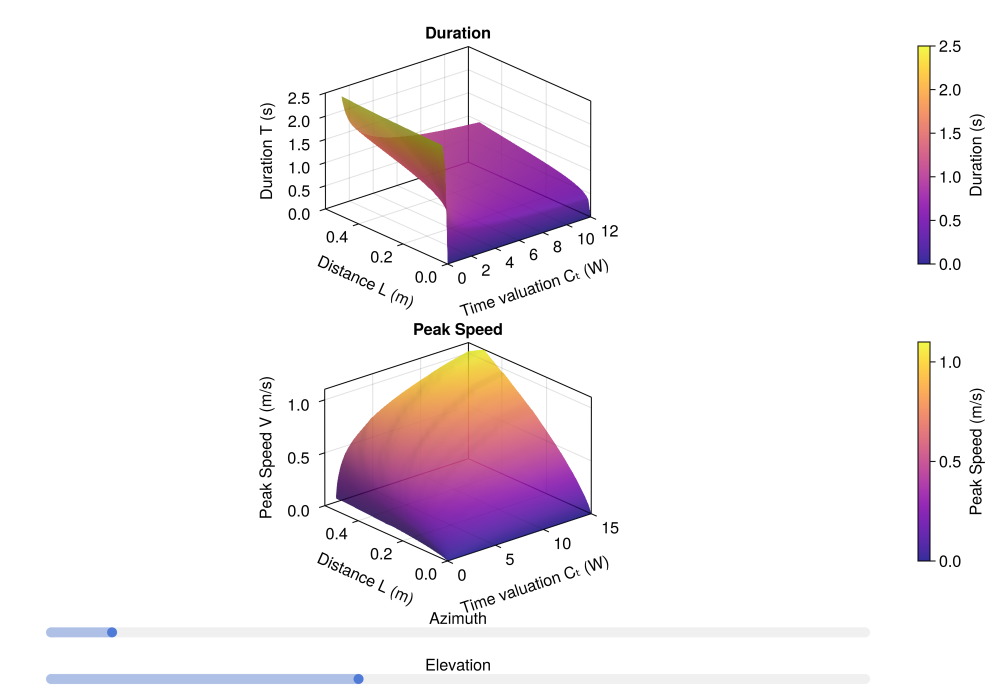

In [ ]:
f, mainseq, fit = replicate_pub_whk_sim("reachgrid_ctmech.mat")
f

In [3]:
function overlay_subject_data(fig, mainseq::main_sequence; mrkr=:circle, color=:red, size=10)
    """
    Overlays subject data points on the existing surface plots.
    
    Parameters:
    -----------
    fig : GLMakie.Figure
        The figure with surfaces created by plot_vt_surfaces
    mainseq : main_sequence
        
    ms : Symbol
        Marker symbol to use for data points
    color : Symbol or RGB
        Color for the subject data points
    size : Number
        Size of the markers
        
    Returns:
    --------
    fig : Figure
        The updated figure with overlaid data points
    """
        
    # Extract relevant fields
    subject_distances = mainseq.distance
    subject_durations = mainseq.duration  
    subject_peak_speeds = mainseq.peak_speed  
    # ct is one number per subject, so we need to repeat it for each distance
    subject_ct = ones(length(mainseq.distance))*mainseq.time_valuation
    
    # Get the existing axes from the figure
    axes = fig.content
    duration_axis = axes[1]
    peak_speed_axis = axes[3] 
    
    # Add data points to the duration surface
    GLMakie.scatter!(duration_axis, 
                    subject_ct, 
                    subject_distances, 
                    subject_durations,
                    markersize=size, 
                    color=color, 
                    marker=mrkr)
    
    # Add data points to the peak speed surface
    GLMakie.scatter!(peak_speed_axis, 
                    subject_ct, 
                    subject_distances, 
                    subject_peak_speeds,
                    markersize=size, 
                    color=color, 
                    marker=mrkr)
    
    return fig
end


overlay_subject_data (generic function with 1 method)

### Subject PowerLaw fit 
fn_v = fit.

In [ ]:
function fit_ct_2vandt(k_v,k_t,ms::main_sequence;norm_v=1.0,norm_t=1.0,only_v1_t2=0,M=1)
  """
  Fit the main sequence data (V, T) simultaneously via the two powerlaws for V and T, each of which depend on Ct and D. 
  #Arguments:
    k_v : float64
      the constant for the peak_speeds powerlaw
    k_t : float64
      the constant for the durations powerlaw
    ms : main_sequence object
      the main sequence data
    Optional:
    norm_v : float64
      value to normalize the peak_speeds
    norm_t : float64
      value to normalize the durations
    only_v1_t2 : int
      if 1, fit only the peak_speeds, if 2, fit only the durations
    
  #Returns:
      ms: main_sequence
        the main sequence data with the time_valuation, 
        predicted peak_speeds and durations, and R² values 
    
  """
  # normalize the peak_speeds and durations
  V  = ms.peak_speed
  T = ms.duration
  L = ms.distance

  # # Define power law functions
  # V, peak_speed.
    fn_v = (c_t, L) -> k_v*c_t.^(1/4) .* ((1/M)^(1/4)) .* L.^(3/4)
    
    A_v = (k_v/norm_v) * L.^(3/4)
    b_v = (V ./ norm_v)

    # T, duration. note: c_t is in the denominator.
    fn_t = (c_t, L) -> k_t*(1 ./ c_t).^(1/4) .* ((M)^(1/4)) .* L.^(1/4)

    A_t = T/norm_t
    b_t = (k_t/norm_t) * L.^(1/4)
    
    # stack T and V. if we want to fit only one, do it here.
    A = [A_t; A_v]
    b = [b_t; b_v]

  if only_v1_t2 == 1
      A = [A_v]
      b = [b_v]
  elseif only_v1_t2 == 2
      A = [A_t]
      b = [b_t]
  end

  # Convert to DataFrame (equivalent to MATLAB's table)
  valid_indices = .!isnan.(vec(A)) .& .!isnan.(vec(b))
  df = DataFrame(A=vec(A)[valid_indices], b=vec(b)[valid_indices])
  #display A to screen to debug
  print("A: ")
  println(A)
  print("b: ")
  println(b)

  # use GLM.jl for linear modeling instead of MATLAB's fitlm
  # Fit linear model without intercept (the -1 in MATLAB notation)
  # In Julia GLM, this is done with the @formula syntax
  
  model = lm(@formula(b ~ A - 1), df)

  # Extract coefficient and raise to power 4 
  # In MATLAB: stats.Coefficients.Estimate(1)
  # In Julia: coef(model)[1]
  CTstar = (coef(model)[1])^4  # we solve for c_t^(1/4)
  #
  # Calculate R² value
  # In MATLAB: stats.Rsquared.Ordinary
  # In Julia: r2(model)
  r2_val = r2(model)
  # generate predictions using fn_v and fn_t
  peak_speed_star = fn_v(CTstar, L)
  duration_star = fn_t(CTstar, L)
  time_valuation = CTstar
  ms_star = main_sequence(peak_speed = peak_speed_star, duration = duration_star, distance = L, time_valuation = time_valuation)
  return (ms_star, r2_val)
end


fit_ct_2vandt (generic function with 1 method)

In [5]:
k_v = fit.k_v
k_t = fit.k_t
# loop from subject # 1 to 9, fit_ct_2vandt
# pre-allocate main_sequence vector of length 9 
main_seq_star_vec = Vector{main_sequence}(undef, 9)
main_seq_vec = Vector{main_sequence}(undef, 9)
R2_vec = zeros(9)
conditions = ["eday","fast","slow","infp"]
for i in 1:9
    #construct filename
    
    fname = "ms_"*conditions[1]*"_subject_"*string(i)*".mat"
    dir   = dirname(dirname(@__FILE__))
    fpath = joinpath(dir,"data","reaching","subjects",fname)
    data = matread(fpath)
    ms = main_sequence(peak_speed = data["peak_speed"], duration = data["duration"], distance = data["distance"],time_valuation = 0.0)
    main_seq_vec[i] = ms
    ms_fit = fit_ct_2vandt(k_v,k_t,ms,norm_v=.5,norm_t=1.0,only_v1_t2=0)
    main_seq_star_vec[i] = ms_fit[1]
    R2_vec[i] = ms_fit[2]
end


A: [NaN; 1.147; 2.027; 1.083; 1.143; 1.2690000000000001; 1.5190000000000001; 1.343; 1.481; 1.691; 2.083; 2.523; 1.205; 1.094; 1.502; 0.84; 1.022; 1.186; 1.361; 1.85; 1.351; 1.194; 1.298; 1.112; 1.08; 0.881; 1.306; 1.685; 1.585; 0.557; 0.858; 1.286; 1.877; 1.2670000000000001; 0.974; 1.298; 1.125; 1.395; 1.317; 1.552; 1.566; 1.045; 1.103; 1.018; 1.329; 0.884; 1.111; 1.453; 1.411; 1.526; 2.029; 1.295; 1.164; 1.327; 1.2670000000000001; 0.802; 0.779; 1.356; 1.094; 0.886; 0.8310000000000001; 0.28600000000000003; 1.625; 0.728; 1.447; 1.347; 0.934; 1.171; 1.233; NaN; 2.1390000000000002; 1.162; 1.709; 0.8310000000000001; 1.0130000000000001; 0.881; 0.969; 1.048; 1.758; 1.381; 1.8960000000000001; 1.723; 0.839; 1.117; 1.069; 0.772; 0.835; 1.218; 1.31; 0.559; 1.207; 1.3940000000000001; 1.879; 0.905; 0.8180000000000001; 1.22; 1.029; 1.053; 1.984; 1.474; 1.291; 0.879; 1.291; 0.92; 0.151; 0.884; 1.455; 0.865; 1.217; 1.16; 1.7630000000000001; 1.172; 0.847; 1.09; 1.167; 0.88; 1.048; 1.467; 1.237; NaN; 1

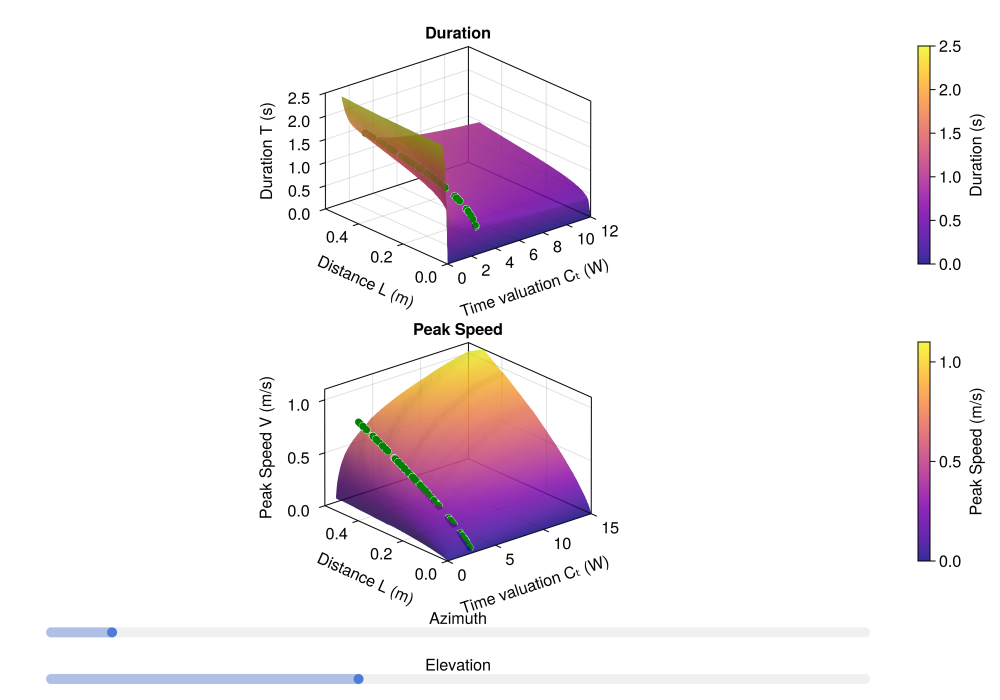

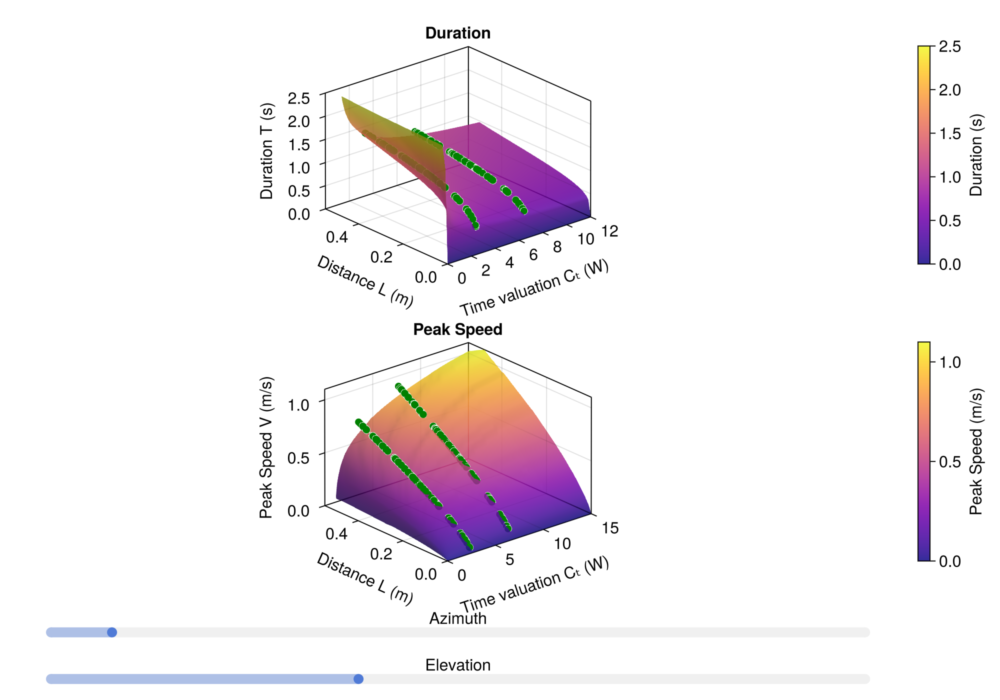

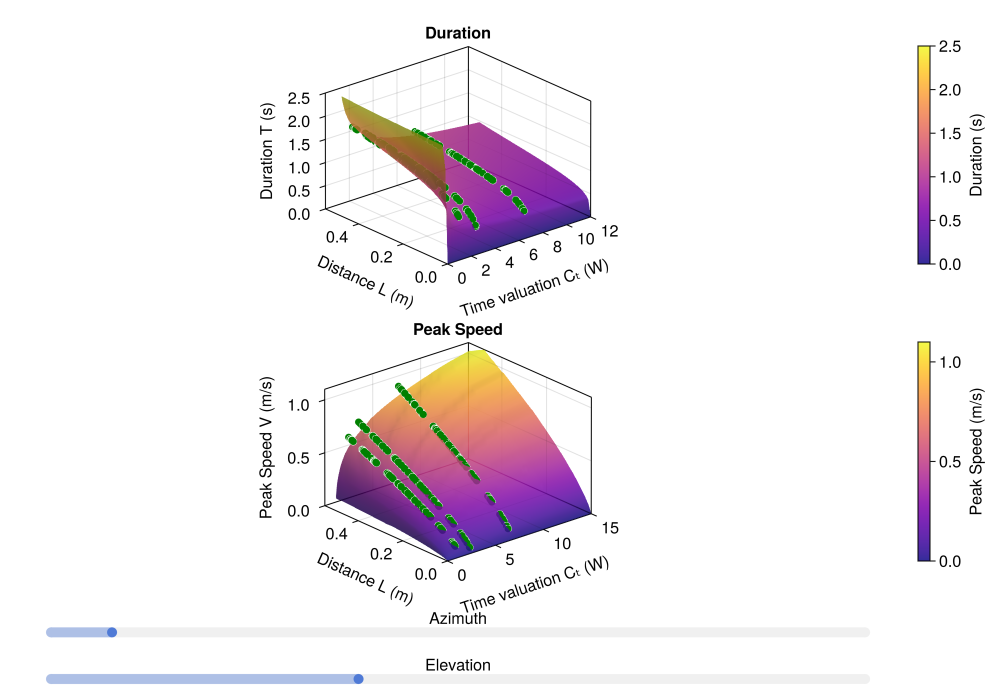

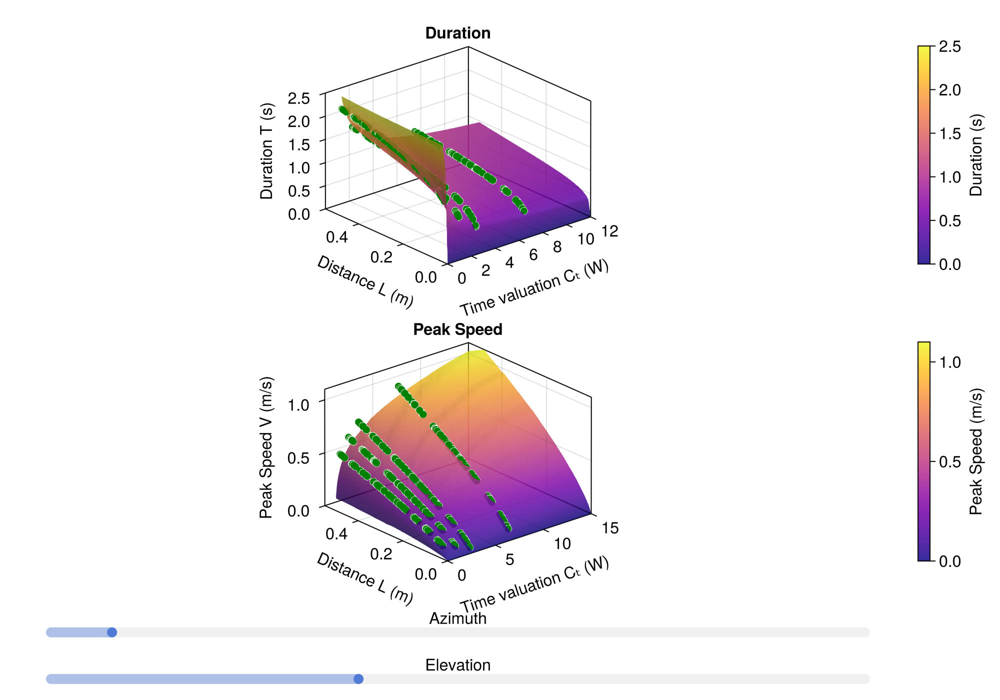

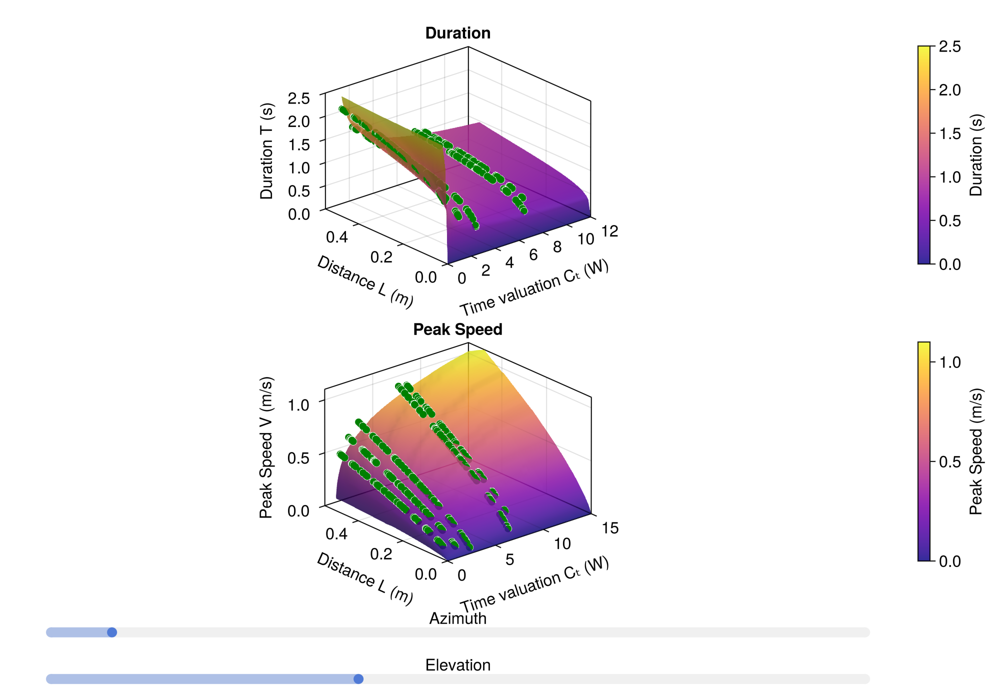

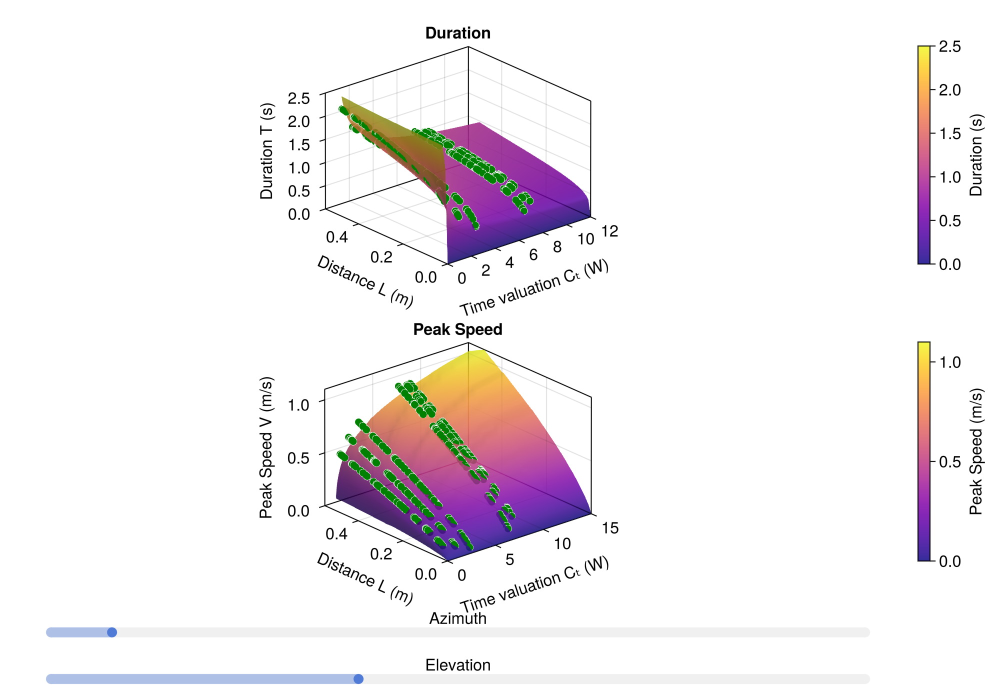

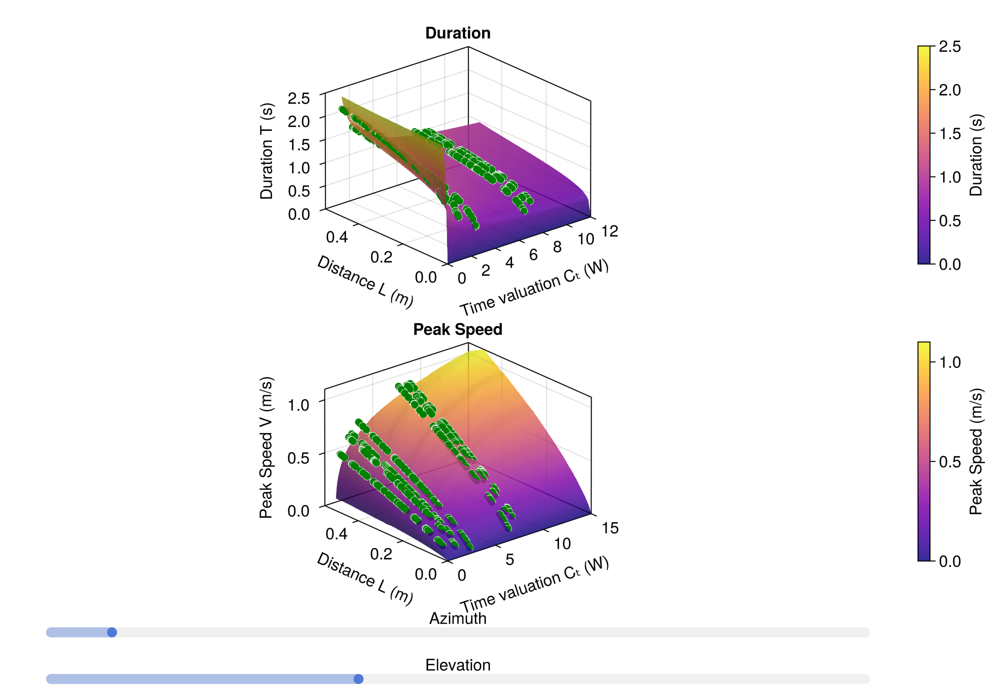

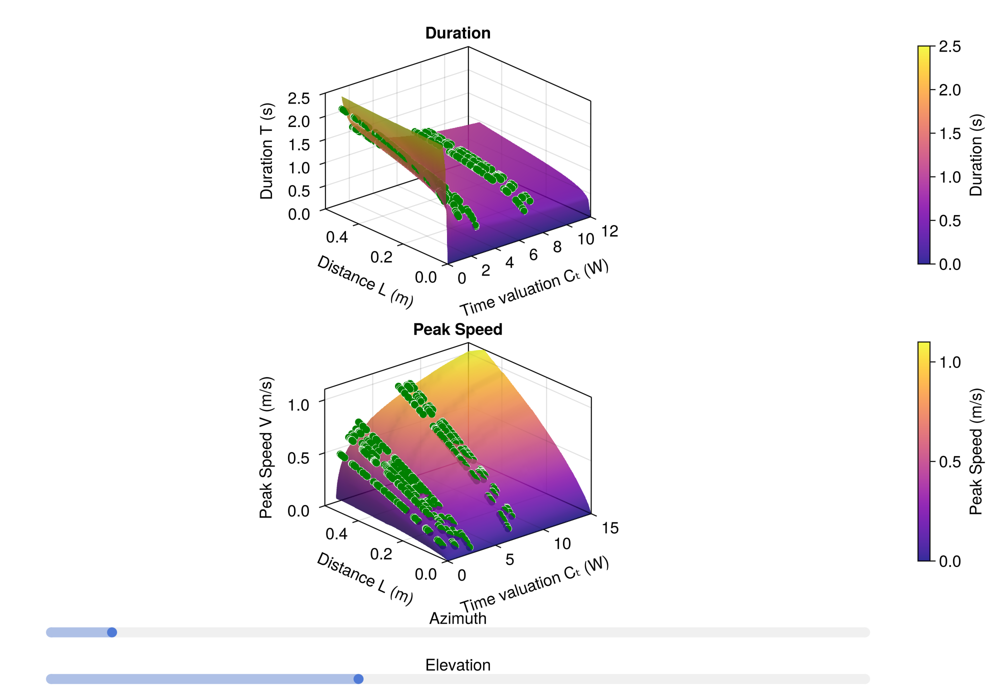

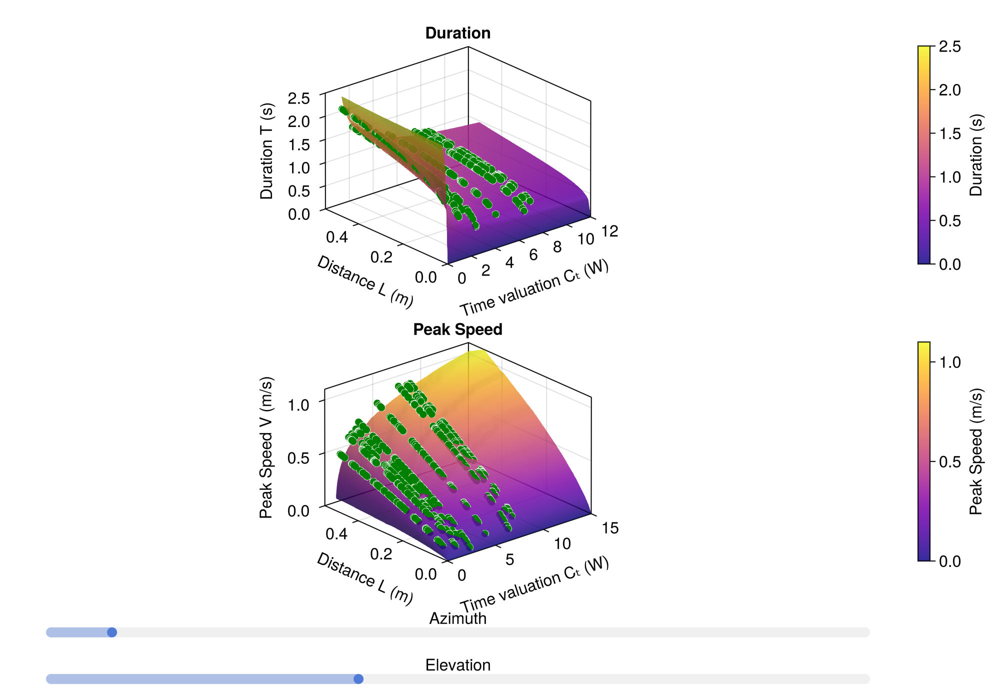

In [6]:
# loop across the two ms vectors and plot the human data and model fits
for i in 1:9
    fig = overlay_subject_data(f, main_seq_star_vec[i], mrkr=:circle, color=:green, size=10)
    display(f)
end

In [13]:
fit.allfit

Dict{String, Any} with 10 entries:
  "rmsep_v" => 0.0536685
  "k_v"     => 0.991773
  "f_ctd2t" => #21
  "R2_t"    => 0.98026
  "k_t"     => 2.26403
  "RMSE_t"  => 0.133423
  "rmse_v"  => 0.0290256
  "f_ctd2v" => #20
  "R2_v"    => 0.993511
  "rmsep_t" => 0.114358

In [8]:
fit.k-t

ErrorException: type fn_fit has no field k

In [9]:
fit.k_t

2.264028096275288

In [10]:
#set base as location of this file, up two levels
base = dirname(dirname(@__FILE__))
simfile = joinpath(base, "data","reaching","reachgrid.mat")
  data = matread(simfile)
  distance = data["distance"]
  duration = data["duration"]
  peak_speed = data["peakspeed"]
  timeValuation = data["timeValuation"]
  
  timeValuation = timeValuation
  #resave
  savename = joinpath(base, "data","reaching","reachgrid_ctmech.mat")
  matwrite(simfile, Dict("distance" => distance, "duration" => duration, "peak_speed" => peak_speed, "time_valuation" => timeValuation))

ErrorException: File "/Users/jeremy/Git/powerlaws-et/data/reaching/reachgrid.mat" does not exist and create was not specified